# LPDR 모델 튜닝 시나리오
데이터 드리프트 분석 기반 모델 재학습을 통한 추론성능 개선 파이프라인 구성<br>
<br>
* 기능 추가<br><br>
    * 복수 데이터셋에 대한 시각화 및 분석 기능<br>
    * 개별 데이터의 추가, 삭제 등 데이터 수정 기능<br>

## 데이터 수정 기능 테스트
기존 데이터셋에 새로운 데이터 추가<br>
데이터 분류 및 시각화 기능 제어

In [7]:
import fiftyone as fo
import fiftyone.brain as fob
import clip
import torch

import numpy as np

fo.list_datasets()

['kolp_dataset',
 'ls-annotation-example',
 'test_raw_imgs',
 'tunelpdr_cur',
 'tunelpdr_merged',
 'tunelpdr_ref']

In [8]:
fo.delete_dataset("tunelpdr_merged")
fo.delete_dataset("tunelpdr_ref")
fo.delete_dataset("tunelpdr_cur")

fo.list_datasets()

['kolp_dataset', 'ls-annotation-example', 'test_raw_imgs']

In [9]:
splits = ['train', 'val', 'test']
ref_dataset = fo.Dataset("tunelpdr_ref")
cur_dataset = fo.Dataset("tunelpdr_cur")

for split in splits:
    ref_dataset.add_dir(
        dataset_dir='../datasets/tunelpdr_ref',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
    cur_dataset.add_dir(
        dataset_dir='../datasets/tunelpdr_cur',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )

 100% |███████████████| 2372/2372 [1.1s elapsed, 0s remaining, 2.2K samples/s]         
 100% |█████████████████| 284/284 [449.1ms elapsed, 0s remaining, 632.3 samples/s]     
 100% |███████████████████| 66/66 [41.5ms elapsed, 0s remaining, 1.6K samples/s]     
 100% |███████████████████| 40/40 [53.4ms elapsed, 0s remaining, 749.2 samples/s]    
 100% |███████████████████| 11/11 [9.1ms elapsed, 0s remaining, 1.2K samples/s]      
 100% |███████████████████| 19/19 [27.7ms elapsed, 0s remaining, 685.7 samples/s]    


In [10]:
from PIL import Image

# CLIP 모델 로드
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 임베딩 생성 함수 : 이미지, 텍스트 구분
def get_embeddings(sample):

    if "image" in sample.tags:
        with torch.no_grad():
            inputs = preprocess(Image.open(sample.filepath)).unsqueeze(0).to(device)
            features = model.encode_image(inputs)

    # elif sample.tags[1] == "text":
    #     with torch.no_grad():
    #         inputs = clip.tokenize(sample.original_text, context_length=77, truncate=True).to(device)
    #         features = model.encode_text(inputs)

    return features.cpu().numpy().flatten()

In [11]:
tmp = []
test_sample = ref_dataset.first()
test_sample.tags.append("image")

test_embed = get_embeddings(test_sample)
tmp.append(test_embed)

tmp

[array([ 1.79878116e-01,  4.03871238e-01,  4.25222099e-01,  3.03541925e-02,
        -3.10817324e-02, -1.77015010e-02, -7.05806315e-02,  3.63875419e-01,
         1.32120892e-01, -1.83141872e-01,  2.72715569e-01,  7.70476013e-02,
         3.26890618e-01,  4.19722557e-01,  2.36908719e-01, -3.11335362e-02,
         4.65256795e-02,  3.43314469e-01, -2.21666649e-01, -2.38627940e-01,
        -2.70521134e-01,  2.00133592e-01, -1.22712106e-01, -1.72539100e-01,
        -3.63200724e-01,  5.27299106e-01,  2.49098957e-01, -8.77972692e-02,
        -1.95800707e-01,  7.03408644e-02, -6.15200818e-01, -4.54167128e-01,
        -1.84947178e-01,  7.68761188e-02,  1.45041391e-01,  3.92439812e-01,
         3.59354913e-01,  3.98844242e-01,  1.58378169e-01,  1.19709074e+00,
        -3.38561088e-02,  6.05815053e-01, -1.33198380e-01, -1.91920295e-01,
        -3.51850331e-01,  2.99904019e-01, -2.30872661e-01, -2.49551892e-01,
         2.80974746e-01,  2.05494642e-01, -7.16063380e-01, -4.67587709e-02,
         8.4

In [12]:
tmp2 = np.array(tmp)

tmp2.shape

(1, 512)

In [13]:
tmp3 = np.array(tmp2)

tmp3.shape

(1, 512)

In [14]:
embeddings = []

print("\nREF 임베딩 추출 시작\n")
cnt = 0
for sample in ref_dataset:
    sample.tags.append("image")
    sample.save()
    embedding = get_embeddings(sample)
    embeddings.append(embedding)
    cnt += 1
    if cnt % 100 == 0:
        print(f"{cnt}개 완료")

for sample, embedding in zip(ref_dataset, embeddings):
    sample['clip_embeddings'] = embedding.tolist()
    sample['source'] = 'ref'
    sample.save()


REF 임베딩 추출 시작

100개 완료
200개 완료
300개 완료
400개 완료
500개 완료
600개 완료
700개 완료
800개 완료
900개 완료
1000개 완료
1100개 완료
1200개 완료
1300개 완료
1400개 완료
1500개 완료
1600개 완료
1700개 완료
1800개 완료
1900개 완료
2000개 완료
2100개 완료
2200개 완료
2300개 완료
2400개 완료


In [15]:
print("\nCUR 임베딩 추출 시작\n")
cnt = 0
for sample in cur_dataset:
    sample.tags.append("image")
    sample.save()
    embedding = get_embeddings(sample)
    embeddings.append(embedding)
    cnt += 1
    if cnt % 100 == 0:
        print(f"{cnt}개 완료")

# 임베딩을 데이터셋에 추가
for sample, embedding in zip(cur_dataset, embeddings):
    sample['clip_embeddings'] = embedding.tolist()
    sample['source'] = 'cur'
    sample.save()


CUR 임베딩 추출 시작

100개 완료
200개 완료
300개 완료


In [16]:
print(len(ref_dataset))
print(len(cur_dataset))
print(len(ref_dataset) + len(cur_dataset))


2449
343
2792


In [17]:
ref_dataset.first()

<Sample: {
    'id': '674955f448e04fed5e020f2b',
    'media_type': 'image',
    'filepath': '/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/train/images/-2-_jpg.rf.8f2d818f430bb290b487c996b15fb79d.jpg',
    'tags': ['train', 'image', 'image'],
    'metadata': None,
    'created_at': datetime.datetime(2024, 11, 29, 5, 49, 40, 638000),
    'last_modified_at': datetime.datetime(2024, 11, 29, 5, 51, 15, 991440),
    'ground_truth': <Detections: {
        'detections': [
            <Detection: {
                'id': '674955f448e04fed5e020f28',
                'attributes': {},
                'tags': [],
                'label': 'License Plate',
                'bounding_box': [0.0, 0.5738281249999999, 0.0796875, 0.11171875],
                'mask': None,
                'confidence': None,
                'index': None,
            }>,
            <Detection: {
                'id': '674955f448e04fed5e020f29',
                'attributes': {},
                

In [18]:
cur_dataset.first()

<Sample: {
    'id': '674955f548e04fed5e022387',
    'media_type': 'image',
    'filepath': '/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/train/images/video-12-1-_png.rf.67938ff02fb900eb928f1c52e4770608.jpg',
    'tags': ['train', 'image'],
    'metadata': None,
    'created_at': datetime.datetime(2024, 11, 29, 5, 49, 41, 740000),
    'last_modified_at': datetime.datetime(2024, 11, 29, 5, 51, 31, 677000),
    'ground_truth': <Detections: {
        'detections': [
            <Detection: {
                'id': '674955f548e04fed5e022382',
                'attributes': {},
                'tags': [],
                'label': 'License Plate',
                'bounding_box': [0.13828125, 0.65625, 0.040625, 0.046875],
                'mask': None,
                'confidence': None,
                'index': None,
            }>,
            <Detection: {
                'id': '674955f548e04fed5e022383',
                'attributes': {},
                'tags': 

In [19]:
merged_dataset = fo.Dataset("tunelpdr_merged")
merged_dataset.merge_samples(ref_dataset)
merged_dataset.merge_samples(cur_dataset)

len(merged_dataset)

2792

In [20]:
embeddings = np.array(embeddings)

# 임베딩 시각화
results = fob.compute_visualization(
    merged_dataset,
    embeddings=embeddings,
    patches_field="clip_embeddings",
    brain_key="clip_embeddings",
    # num_dims=3,
    plot_points=True,
    verbose=True,
)

Generating visualization...


/Users/bhc/opt/anaconda3/envs/datadrift/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


UMAP( verbose=True)
Fri Nov 29 14:51:40 2024 Construct fuzzy simplicial set


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Fri Nov 29 14:51:43 2024 Finding Nearest Neighbors
Fri Nov 29 14:51:44 2024 Finished Nearest Neighbor Search
Fri Nov 29 14:51:45 2024 Construct embedding


Epochs completed:  13%| █▎         67/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs


Epochs completed:  47%| ████▋      235/500 [00:01]

	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs


Epochs completed:  82%| ████████▏  410/500 [00:01]

	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs


Epochs completed: 100%| ██████████ 500/500 [00:01]


	completed  450  /  500 epochs
Fri Nov 29 14:51:47 2024 Finished embedding


In [21]:
session = fo.launch_app(merged_dataset)


## 데이터 임베딩 피쳐 비교

두 가지 방식으로 데이터셋을 비교, 분석
1. 임베딩 벡터의 산점도 그래프를 통해 시각적으로 얼마나 다른 형상, 위치를 보이는지 관측<br>
<br>
2. 다양한 지표를 활용해 데이터 임베딩의 분포 차이를 정량적으로 비교


### 1. 그래프 분석

각 데이터셋의 임베딩 벡터 인코드 및 시각화 관측

In [2]:
import fiftyone as fo
import fiftyone.brain as fob
import clip
import torch

import numpy as np
from PIL import Image
from tqdm import tqdm

# CLIP 모델 로드
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

## 필요한 기능 함수 정의
# 개별 데이터 태깅, 메타데이터 추가
def add_tags(dataset, source):
    
    for sample in dataset:
        sample.tags.append("image")
        sample['source'] = source
        sample.save()

# 임베딩 생성 함수 : 이미지, 텍스트 구분
def get_embeddings(sample):

    if "image" in sample.tags:
        with torch.no_grad():
            inputs = preprocess(Image.open(sample.filepath)).unsqueeze(0).to(device)
            features = model.encode_image(inputs)

    # elif sample.tags[1] == "text":
    #     with torch.no_grad():
    #         inputs = clip.tokenize(sample.original_text, context_length=77, truncate=True).to(device)
    #         features = model.encode_text(inputs)

    return features.cpu().numpy().flatten()

# 개별 데이터에 대한 임베딩 추출 및 임베딩 매핑 리스트 생성
def add_embeddings(dataset):

    print(f"{dataset}")
    for sample in tqdm(dataset, desc=f"{dataset.name} 임베딩 추출 중"):
        embedding = get_embeddings(sample)
        sample['clip_embeddings'] = embedding.tolist()
        sample.save()

def collect_image_embeddings_by_sample_id(dataset):

    image_embeddings = {}
    for sample in dataset:
        sample_id = sample.id
        if 'clip_embeddings' in sample:
            # 샘플 ID를 키로, 이미지 임베딩을 값으로 저장
            image_embeddings[sample_id] = np.array(sample['clip_embeddings'])

    return image_embeddings

In [4]:
fo.delete_dataset("tunelpdr_ref")
fo.delete_dataset("tunelpdr_cur")
fo.delete_dataset("tunelpdr_pred")
fo.delete_dataset("tunelpdr_merged_embedtest")
fo.delete_dataset("tunelpdr_merged_embedtest2")
fo.delete_dataset("tunelpdr_merged")
fo.delete_dataset("tunelpdr_merged_v2")

In [5]:
fo.list_datasets()

['kolp_dataset', 'ls-annotation-example', 'test_raw_imgs']

In [6]:
splits = ['train', 'val', 'test']
ref_dataset = fo.Dataset("tunelpdr_ref")
cur_dataset = fo.Dataset("tunelpdr_cur")
test_dataset = fo.Dataset("tunelpdr_pred")

for split in splits:
    ref_dataset.add_dir(
        dataset_dir='../datasets/tunelpdr_ref',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
    cur_dataset.add_dir(
        dataset_dir='../datasets/tunelpdr_cur',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
    test_dataset.add_dir(
        dataset_dir='../datasets/tunelpdr_pred',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
add_tags(ref_dataset, "ref")
add_tags(cur_dataset, "cur")
add_tags(test_dataset, "test")

 100% |███████████████| 2372/2372 [966.9ms elapsed, 0s remaining, 2.5K samples/s]      
 100% |█████████████████| 284/284 [303.8ms elapsed, 0s remaining, 934.7 samples/s]    
 100% |███████████████| 7003/7003 [5.9s elapsed, 0s remaining, 1.3K samples/s]      
 100% |███████████████████| 66/66 [26.1ms elapsed, 0s remaining, 2.5K samples/s]      
 100% |███████████████████| 40/40 [48.1ms elapsed, 0s remaining, 832.0 samples/s]    
 100% |███████████████| 2001/2001 [1.7s elapsed, 0s remaining, 1.2K samples/s]         
 100% |███████████████████| 11/11 [6.7ms elapsed, 0s remaining, 1.6K samples/s]      
 100% |███████████████████| 19/19 [24.3ms elapsed, 0s remaining, 780.7 samples/s]    
 100% |█████████████████| 996/996 [814.9ms elapsed, 0s remaining, 1.2K samples/s]      


In [7]:
print(ref_dataset.first().tags)
print(ref_dataset.first()['source'])
print()

print(cur_dataset.first().tags)
print(cur_dataset.first()['source'])
print()

print(test_dataset.first().tags)
print(test_dataset.first()['source'])

['train', 'image']
ref

['train', 'image']
cur

['train', 'image']
test


In [8]:
merged_dataset = fo.Dataset("tunelpdr_merged")
merged_dataset.merge_samples(ref_dataset)
merged_dataset.merge_samples(cur_dataset)
merged_dataset.merge_samples(test_dataset)

print(len(merged_dataset))

12792


In [9]:
# 데이터셋에서 이미지 임베딩 수집
add_embeddings(merged_dataset)
image_embeddings_by_sample_id = collect_image_embeddings_by_sample_id(merged_dataset)

# 임베딩 시각화
results = fob.compute_visualization(
    merged_dataset,
    embeddings=image_embeddings_by_sample_id,
    brain_key="clip_embeddings",
    # num_dims=3,
    plot_points=True,
    verbose=True,
)

Name:        tunelpdr_merged
Media type:  image
Num samples: 12792
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField


tunelpdr_merged 임베딩 추출 중: 100%|██████████| 12792/12792 [06:53<00:00, 30.91it/s]


Generating visualization...


/Users/bhc/opt/anaconda3/envs/datadrift/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


UMAP( verbose=True)
Tue Dec  3 15:04:05 2024 Construct fuzzy simplicial set
Tue Dec  3 15:04:05 2024 Finding Nearest Neighbors
Tue Dec  3 15:04:05 2024 Building RP forest with 11 trees


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Tue Dec  3 15:04:07 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Tue Dec  3 15:04:11 2024 Finished Nearest Neighbor Search
Tue Dec  3 15:04:12 2024 Construct embedding


Epochs completed:  10%| ▉          19/200 [00:01]

	completed  0  /  200 epochs
	completed  20  /  200 epochs


Epochs completed:  33%| ███▎       66/200 [00:01]

	completed  40  /  200 epochs
	completed  60  /  200 epochs


Epochs completed:  49%| ████▉      98/200 [00:01]

	completed  80  /  200 epochs
	completed  100  /  200 epochs


Epochs completed:  72%| ███████▎   145/200 [00:01]

	completed  120  /  200 epochs
	completed  140  /  200 epochs


Epochs completed:  88%| ████████▊  177/200 [00:02]

	completed  160  /  200 epochs
	completed  180  /  200 epochs


Epochs completed: 100%| ██████████ 200/200 [00:02]


Tue Dec  3 15:04:15 2024 Finished embedding



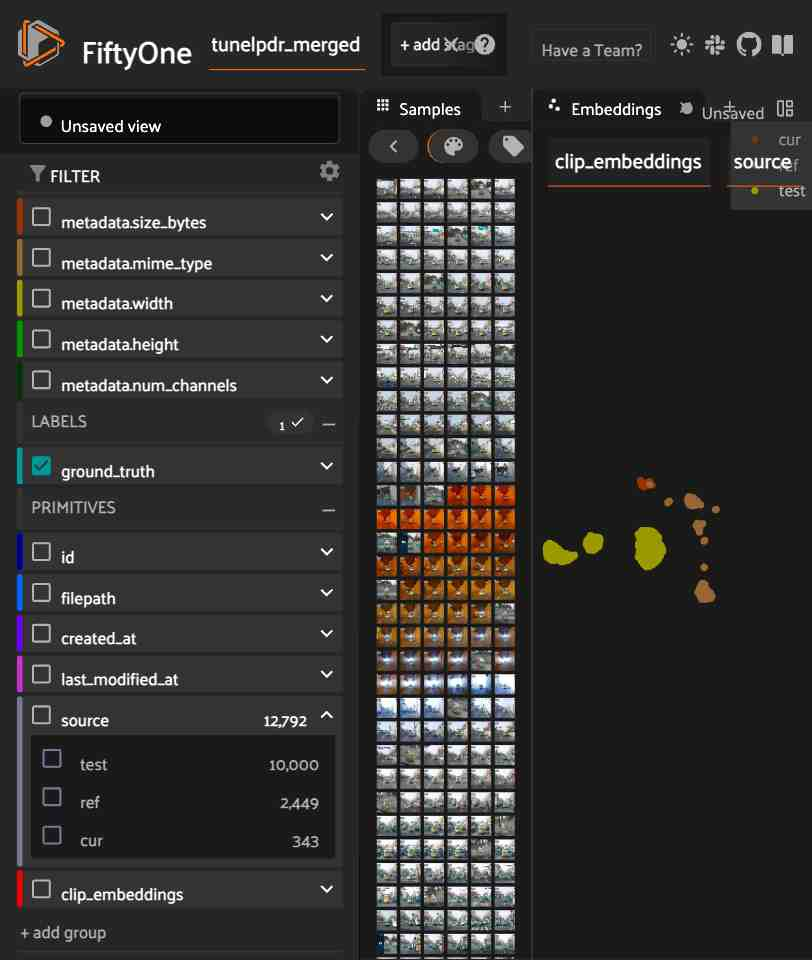

In [10]:
session = fo.launch_app(merged_dataset)

### 2. 지표 분석
데이터셋의 임베딩에 따른 각종 분포 지표 비교

In [30]:
import numpy as np
from scipy.spatial.distance import cdist
from fiftyone import ViewField as F

# 소스별로 임베딩을 수집하는 함수
def collect_embeddings_by_source(dataset):
    embeddings_by_source = {'ref': [], 'cur': [], 'test': []}

    for source in embeddings_by_source.keys():
        view = dataset.match(F("source") == source)
        for sample in view:
            if 'clip_embeddings' in sample:
                embeddings_by_source[source].append(sample['clip_embeddings'])

    for source in embeddings_by_source:
        embeddings_by_source[source] = np.array(embeddings_by_source[source])

    return embeddings_by_source

def compute_mmd(X, Y, kernel='rbf', gamma=0.01):
    """두 데이터셋 X와 Y 간의 최대 평균 차이(MMD)를 계산합니다."""
    if kernel == 'rbf':
        # XX, YY, XY는 각각 X와 X, Y와 Y, X와 Y 간의 커널 매트릭스입니다.
        XX = np.exp(-gamma * cdist(X, X, 'sqeuclidean'))
        YY = np.exp(-gamma * cdist(Y, Y, 'sqeuclidean'))
        XY = np.exp(-gamma * cdist(X, Y, 'sqeuclidean'))
    else:
        raise ValueError("지원되지 않는 커널 타입입니다.")

    # MMD 계산
    mmd = XX.mean() + YY.mean() - 2 * XY.mean()
    return mmd

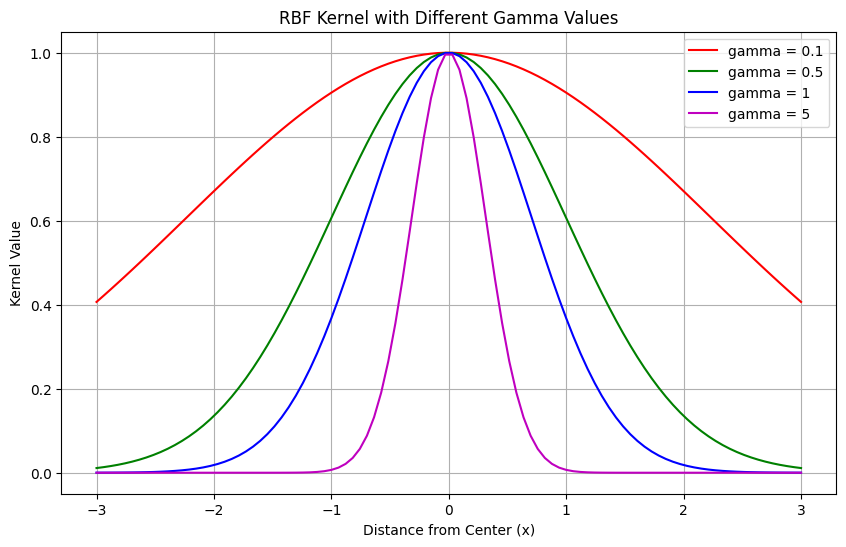

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# RBF 커널 함수
def rbf_kernel(x, y, gamma):
    return np.exp(-gamma * np.linalg.norm(x - y) ** 2)

# 두 점 사이의 거리
x = np.linspace(-3, 3, 100)
y = np.zeros_like(x)

# 다양한 gamma 값에 대한 RBF 커널 값 계산
gamma_values = [0.1, 0.5, 1, 5]
colors = ['r', 'g', 'b', 'm']

plt.figure(figsize=(10, 6))
for gamma, color in zip(gamma_values, colors):
    kernel_values = [rbf_kernel(np.array([xi]), np.array([0]), gamma) for xi in x]
    plt.plot(x, kernel_values, label=f'gamma = {gamma}', color=color)

plt.title('RBF Kernel with Different Gamma Values')
plt.xlabel('Distance from Center (x)')
plt.ylabel('Kernel Value')
plt.legend()
plt.grid(True)
plt.show()

In [32]:
fo.list_datasets()

['kolp_dataset',
 'ls-annotation-example',
 'test_raw_imgs',
 'tunelpdr_cur',
 'tunelpdr_merged',
 'tunelpdr_ref',
 'tunelpdr_test']

In [33]:
# 임베딩 수집
embeddings_by_source = collect_embeddings_by_source(merged_dataset)

# 각 소스의 임베딩 수 확인
for source, embeddings in embeddings_by_source.items():
    print(f"{source} 임베딩 수: {len(embeddings)}")

ref 임베딩 수: 2449
cur 임베딩 수: 343
test 임베딩 수: 10000


In [37]:
embeddings_by_source['ref'][1].shape

(512,)

In [34]:
# MMD 계산
mmd_ref_cur = compute_mmd(embeddings_by_source['ref'], embeddings_by_source['cur'])
mmd_ref_test = compute_mmd(embeddings_by_source['ref'], embeddings_by_source['test'])
mmd_cur_test = compute_mmd(embeddings_by_source['cur'], embeddings_by_source['test'])

# 결과 출력
print(f"MMD(ref, cur): {mmd_ref_cur}")
print(f"MMD(ref, test): {mmd_ref_test}")
print(f"MMD(cur, test): {mmd_cur_test}")

MMD(ref, cur): 0.47949018300910673
MMD(ref, test): 0.4801281580392768
MMD(cur, test): 0.3586122889963441


In [39]:
import pandas as pd

# 소스별로 데이터프레임 생성
ref_embeddings = pd.DataFrame(embeddings_by_source.get('ref', []))
cur_embeddings = pd.DataFrame(embeddings_by_source.get('cur', []))
test_embeddings = pd.DataFrame(embeddings_by_source.get('test', []))

# 결과 확인
print("Reference Embeddings:")
print(ref_embeddings.head())
print("\nCurrent Embeddings:")
print(cur_embeddings.head())
print("\nTest Embeddings:")
print(test_embeddings.head())

Reference Embeddings:
        0         1         2         3         4         5         6    \
0  0.179878  0.403871  0.425222  0.030354 -0.031082 -0.017702 -0.070581   
1 -0.003872 -0.067114  0.709240 -0.210426  0.423105 -0.760226  0.170474   
2  0.022004 -0.066023 -0.011743  0.474894 -0.132095 -0.188790  0.104495   
3 -0.357889  0.491190 -0.428118  0.008172  0.019566  0.007055  0.728932   
4 -0.297099  0.337081 -0.459876 -0.074451 -0.027466  0.053834  0.755870   

        7         8         9    ...       502       503       504       505  \
0  0.363875  0.132121 -0.183142  ... -0.453415 -0.087575  0.157716 -0.271731   
1  0.319313  0.672708  0.266424  ... -0.034183  0.005005  0.488547  0.297258   
2  0.012254  0.305412  0.221753  ...  0.323590  0.607500  0.241156  0.414185   
3  0.050338 -0.223499  0.112497  ...  0.405624  0.261026  0.709187  0.376341   
4  0.118997 -0.145580  0.110368  ...  0.504117  0.169038  0.561741  0.339689   

        506       507       508       509     

In [56]:
ref_embeddings.columns = ['col_' + str(x) for x in ref_embeddings.columns]
cur_embeddings.columns = ['col_' + str(x) for x in cur_embeddings.columns]
test_embeddings.columns = ['col_' + str(x) for x in test_embeddings.columns]

ref_embeddings.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_502,col_503,col_504,col_505,col_506,col_507,col_508,col_509,col_510,col_511
0,0.179878,0.403871,0.425222,0.030354,-0.031082,-0.017702,-0.070581,0.363875,0.132121,-0.183142,...,-0.453415,-0.087575,0.157716,-0.271731,-0.084235,-0.185833,0.597627,0.193246,-0.483636,0.310480
1,-0.003872,-0.067114,0.709240,-0.210426,0.423105,-0.760226,0.170474,0.319313,0.672708,0.266424,...,-0.034183,0.005005,0.488547,0.297258,-0.000733,-0.268045,-0.118723,-0.226975,0.044671,0.073146
2,0.022004,-0.066023,-0.011743,0.474894,-0.132095,-0.188790,0.104495,0.012254,0.305412,0.221753,...,0.323590,0.607500,0.241156,0.414185,-0.010234,-0.192324,0.543900,0.043411,-0.104227,0.567150
3,-0.357889,0.491190,-0.428118,0.008172,0.019566,0.007055,0.728932,0.050338,-0.223499,0.112497,...,0.405624,0.261026,0.709187,0.376341,0.016915,0.542766,-0.061819,0.092688,-0.229253,0.289743
4,-0.297099,0.337081,-0.459876,-0.074451,-0.027466,0.053834,0.755870,0.118997,-0.145580,0.110368,...,0.504117,0.169038,0.561741,0.339689,0.038479,0.586900,-0.081422,-0.020168,-0.296263,0.281565


In [58]:
from evidently import ColumnMapping

column_mapping = ColumnMapping(
    embeddings={'small_subset': ref_embeddings.columns[:100], 'full': ref_embeddings.columns[:511]},
    target=None
)

In [59]:
import evidently

from evidently.report import Report
from evidently.metrics.base_metric import generate_column_metrics
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset
from evidently.metrics import *
from evidently.metrics.data_drift.embedding_drift_methods import model, distance, ratio, mmd

from evidently.test_suite import TestSuite
from evidently.tests.base_test import generate_column_tests
from evidently.test_preset import DataStabilityTestPreset, NoTargetPerformanceTestPreset, RegressionTestPreset
from evidently.tests import *

# mmd(maximum mean discrepancy) method report
report = Report(metrics = [
    EmbeddingsDriftMetric('full',
                            drift_method = mmd(
                                threshold = 0.015,
                                pca_components = None,
                                )
                         )
])

report.run(reference_data = ref_embeddings, current_data = cur_embeddings, 
           column_mapping = column_mapping)

report.show(mode='inline')

In [60]:
report.run(reference_data = ref_embeddings, current_data = test_embeddings, 
           column_mapping = column_mapping)

report.show(mode='inline')

In [61]:
report.run(reference_data = cur_embeddings, current_data = test_embeddings, 
           column_mapping = column_mapping)

report.show(mode='inline')

## 모델 테스트 #1
다른 임베딩 피쳐를 가지는 데이터셋에 대한 추론성능 비교<br>
<br>
* 학습 모델 1 : "tunelpdr_ref" 데이터셋을 학습한 모델 (Reference Dataset : 학습을 위한 실험실용 훈련 데이터셋을 가정)<br>
* 학습 모델 2 : "tunelpdr_cur" 데이터셋을 학습한 모델 (Current Dataset : 현장에서 수집된 인풋 데이터셋을 가정)<br>

In [24]:
import os

os.getcwd()

'/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/notebooks'

In [64]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

ref_dataset_path = "../datasets/tunelpdr_ref/"
cur_dataset_path = "../datasets/tunelpdr_cur/"
model = YOLO("../models/yolov8n.pt")

### 학습모델 1

Reference Dataset을 학습한 모델 학습

In [25]:
from pathlib import Path

# Define the absolute path for 'data.yaml'
data_path = str(Path(ref_dataset_path + 'dataset.yaml').resolve())

# Train the model
model.train(
    data=data_path,  # Path to the data configuration file
    epochs=10,                        # Number of training epochs
    imgsz=640,                        # Image size
    batch=4,                         # Batch size
    device="mps"                          # GPU device index (use 'cpu' for CPU training)
)

New https://pypi.org/project/ultralytics/8.3.39 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/dataset.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks

train: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/train/labels... 2372 images, 7 backgrounds, 0 corrupt: 100%|██████████| 2372/2372 [00:00<00:00, 2818.31it/s]

train: New cache created: /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/train/labels.cache



INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.21 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/valid/labels... 66 images, 1 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<00:00, 2805.78it/s]

val: New cache created: /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/valid/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.37G      1.061      1.872      1.418          4        640: 100%|██████████| 593/593 [04:35<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:09<01:14,  9.26s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:13<00:42,  6.02s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:19<00:36,  6.08s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:23<00:26,  5.27s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:28<00:20,  5.24s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:32<00:14,  4.74s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:35<00:08,  4.32s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:45<00:00,  5.00s/it]


                   all         66         73       0.89      0.507      0.526      0.363

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.33G      1.007     0.9737      1.344          4        640: 100%|██████████| 593/593 [07:06<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:03<00:30,  3.75s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:09<00:33,  4.82s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:14<00:30,  5.13s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:19<00:25,  5.10s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:25<00:21,  5.33s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:31<00:16,  5.61s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:36<00:10,  5.45s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:44<00:00,  4.89s/it]

                   all         66         73      0.925      0.339      0.347      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.45G     0.9388     0.7298      1.266          4        640: 100%|██████████| 593/593 [08:27<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:03<00:29,  3.75s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:10<00:38,  5.46s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:16<00:33,  5.55s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:20<00:24,  4.92s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:27<00:23,  5.94s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:36<00:20,  6.93s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:42<00:13,  6.71s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:51<00:00,  5.72s/it]

                   all         66         73       0.87      0.367      0.363      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      5.74G     0.9093     0.6508      1.255          4        640: 100%|██████████| 593/593 [15:14<00:00,  1.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:05<00:46,  5.81s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:11<00:39,  5.67s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:16<00:31,  5.33s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:20<00:24,  4.93s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:27<00:23,  5.79s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:34<00:18,  6.12s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:41<00:12,  6.39s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:50<00:00,  5.56s/it]


                   all         66         73      0.995      0.205      0.221      0.177

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      7.01G     0.8491     0.5623      1.202          6        640: 100%|██████████| 593/593 [22:12<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:05<00:45,  5.69s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:13<00:47,  6.72s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:18<00:35,  5.91s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:25<00:33,  6.69s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:31<00:24,  6.16s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:38<00:19,  6.42s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:47<00:14,  7.24s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  89%|████████▉ | 8/9 [00:54<00:07,  7.25s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:59<00:00,  6.57s/it]


                   all         66         73      0.977      0.192      0.203      0.169

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      8.26G     0.8109     0.5156      1.173          4        640: 100%|██████████| 593/593 [25:34<00:00,  2.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:10<01:22, 10.34s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:16<00:56,  8.06s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:22<00:43,  7.20s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:30<00:37,  7.44s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [00:44<00:20,  6.89s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [00:47<00:11,  5.69s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  89%|████████▉ | 8/9 [00:52<00:05,  5.54s/it]

WARNING ⚠️ NMS time limit 2.100s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:55<00:00,  6.21s/it]


                   all         66         73      0.943       0.26      0.309      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      9.54G     0.7705     0.4725      1.135          4        640: 100%|██████████| 593/593 [3:04:10<00:00, 18.64s/it]   
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:05<00:47,  5.96s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [00:09<00:32,  4.60s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:15<00:31,  5.25s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [00:21<00:27,  5.50s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [00:26<00:21,  5.35s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [05:53<05:44, 114.70s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [06:03<00:00, 40.40s/it] 


                   all         66         73      0.962       0.37      0.492      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      10.8G     0.7238     0.4358      1.099          4        640: 100%|██████████| 593/593 [28:31:21<00:00, 173.16s/it]   
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [32:37<4:20:56, 1957.07s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  22%|██▏       | 2/9 [39:06<2:00:46, 1035.18s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [39:15<56:37, 566.20s/it]   

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [39:26<28:56, 347.25s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [39:31<14:54, 223.64s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [39:42<07:34, 151.37s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [1:27:23<34:34, 1037.45s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [2:17:20<00:00, 915.57s/it] 


                   all         66         73      0.969      0.429      0.451      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      12.1G     0.6772        0.4      1.073          4        640: 100%|██████████| 593/593 [30:38:37<00:00, 186.03s/it]     
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█         | 1/9 [00:12<01:36, 12.09s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  33%|███▎      | 3/9 [00:51<01:43, 17.30s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▍     | 4/9 [01:04<01:17, 15.59s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▌    | 5/9 [01:34<01:22, 20.52s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  67%|██████▋   | 6/9 [02:31<01:38, 32.91s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  78%|███████▊  | 7/9 [03:41<01:30, 45.21s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [04:23<00:00, 29.26s/it]


                   all         66         73      0.884      0.418       0.47      0.373

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      12.1G      0.622     0.3895     0.9318          4        640:   2%|▏         | 9/593 [04:31<1:48:46, 11.18s/it] 

In [1]:
from ultralytics import YOLO

model = YOLO("runs/detect/train2/weights/last.pt")
model.train(
    resume=True,
)

New https://pypi.org/project/ultralytics/8.3.39 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=runs/detect/train2/weights/last.pt, data=/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/dataset.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=0, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=runs/detect/train2/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=

train: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/train/labels.cache... 2372 images, 7 backgrounds, 0 corrupt: 100%|██████████| 2372/2372 [00:00<?, ?it/s]
/Users/bhc/opt/anaconda3/envs/datadrift/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.21 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_ref/valid/labels.cache... 66 images, 1 backgrounds, 0 corrupt: 100%|██████████| 66/66 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training runs/detect/train2/weights/last.pt from epoch 10 to 10 total epochs
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.26G     0.6545     0.3819      1.055          4        640: 100%|██████████| 593/593 [03:42<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:46<00:00,  5.13s/it]


                   all         66         73      0.852      0.869      0.896      0.658

1 epochs completed in 0.076 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:09<00:00,  1.07s/it]


                   all         66         73      0.852      0.871      0.896      0.658
Speed: 2.0ms preprocess, 30.9ms inference, 0.0ms loss, 46.5ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x5a0e24bf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048,    

### 학습모델 2

Current Dataset을 학습한 모델 학습

In [161]:
from pathlib import Path

# Define the absolute path for 'data.yaml'
ref_dataset_path = "../datasets/tunelpdr_ref/"
cur_dataset_path = "../datasets/tunelpdr_cur/"
model = YOLO("../models/yolov8n.pt")

data_path = str(Path(cur_dataset_path + 'dataset.yaml').resolve())

# Train the model
model.train(
    data=data_path,  # Path to the data configuration file
    epochs=10,                        # Number of training epochs
    imgsz=640,                        # Image size
    batch=16,                         # Batch size
    device="mps"                          # GPU device index (use 'cpu' for CPU training)
)

New https://pypi.org/project/ultralytics/8.3.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=../models/yolov8n.pt, data=/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/dataset.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

train: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/train/labels.cache... 284 images, 2 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]

Plotting labels to runs/detect/train3/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      7.97G      3.532      4.363      1.779         74        640: 100%|██████████| 18/18 [01:26<00:00,  4.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:17<00:17, 17.78s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:22<00:00, 11.11s/it]

                   all         40        253       0.01       0.13    0.00572    0.00154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      8.14G      2.444      2.315      1.151         77        640: 100%|██████████| 18/18 [01:02<00:00,  3.46s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.21s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.85s/it]

                   all         40        253    0.00889      0.158    0.00516    0.00193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      8.19G      2.232      2.008       1.13         63        640: 100%|██████████| 18/18 [01:00<00:00,  3.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.28s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.93s/it]

                   all         40        253     0.0192      0.364      0.128     0.0355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      8.24G      2.203      1.869      1.108         76        640: 100%|██████████| 18/18 [01:00<00:00,  3.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:07<00:07,  7.13s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.55s/it]

                   all         40        253      0.326      0.289      0.215      0.082



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10       8.2G      2.095       1.69       1.08         60        640: 100%|██████████| 18/18 [01:14<00:00,  4.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.76s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.73s/it]

                   all         40        253      0.621      0.239      0.236      0.075



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       8.2G      2.081      1.617      1.071         67        640: 100%|██████████| 18/18 [00:51<00:00,  2.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:05<00:05,  5.59s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.14s/it]

                   all         40        253      0.445      0.233      0.204     0.0526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      8.31G      2.036      1.551      1.045         66        640: 100%|██████████| 18/18 [00:52<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:08<00:08,  8.04s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:12<00:00,  6.50s/it]

                   all         40        253      0.515      0.289      0.264     0.0848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      8.39G      1.994      1.458      1.066         73        640: 100%|██████████| 18/18 [00:49<00:00,  2.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:09<00:09,  9.00s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<00:00,  6.95s/it]

                   all         40        253      0.646      0.277      0.267     0.0979



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      8.47G      1.988      1.443      1.048         69        640: 100%|██████████| 18/18 [00:51<00:00,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.04s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:11<00:00,  5.60s/it]

                   all         40        253      0.437      0.186      0.148     0.0493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      8.48G      1.962      1.392      1.019         71        640: 100%|██████████| 18/18 [00:56<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 1/2 [00:06<00:06,  6.15s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<00:00,  5.30s/it]

                   all         40        253      0.581      0.206      0.183     0.0597



10 epochs completed in 0.214 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:14<00:00,  7.11s/it]


                   all         40        253      0.627      0.241      0.228     0.0837
Speed: 25.6ms preprocess, 58.8ms inference, 0.0ms loss, 152.2ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x30c01e060>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048,    

In [162]:
ref_model = YOLO("./runs/detect/train2/weights/best.pt")
cur_model = YOLO("./runs/detect/train3/weights/best.pt")

test_dataset_path = "../datasets/tunelpdr_pred/"
data_path = str(Path(test_dataset_path + 'dataset.yaml').resolve())

# ref_dataset에 대한 성능 평가
ref_metrics = ref_model.val(data=data_path)

# cur_dataset에 대한 성능 평가
cur_metrics = cur_model.val(data=data_path)

Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_test/valid/labels.cache... 2001 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2001/2001 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 126/126 [06:01<00:00,  2.87s/it]


                   all       2001       7852      0.611      0.361      0.416      0.173
Speed: 0.5ms preprocess, 177.2ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect/val3
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_test/valid/labels.cache... 2001 images, 1 backgrounds, 0 corrupt: 100%|██████████| 2001/2001 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 126/126 [06:11<00:00,  2.95s/it]


                   all       2001       7852     0.0105     0.0106    0.00063   0.000112
Speed: 0.5ms preprocess, 179.5ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs/detect/val4


In [163]:
print(ref_metrics.box.map)
print(ref_metrics.box.map50)
print(ref_metrics.box.map75)
print(ref_metrics.box.maps)
print()

print(cur_metrics.box.map)
print(cur_metrics.box.map50)
print(cur_metrics.box.map75)
print(cur_metrics.box.maps)

0.17287760544598907
0.4163449462847996
0.08144123421508191
[    0.17288]

0.00011150323030320257
0.0006299066359161596
8.876146191771502e-06
[  0.0001115]


## 모델 테스트 #2

변경사항<br>
<br>
* 데이터 모수 일치<br>
<br>
    * dataset Da : 약 2,449pcs (Reference Dataset)<br>
    * dataset Db : 약 2,449pcs (Current Dataset)<br>
    * dataset Dc : 약 343pcs (Test Dataset)<br>
    <br>
    >embedding drift metric ```f(Da, Dc) > f(Db, Dc)```를 가정<br><br>
    >학습모델 M(Da) 와 M(Db) 비교

In [105]:
merged_dataset.match({"source" : "test"})

Dataset:     tunelpdr_merged
Media type:  image
Num samples: 10000
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField
    clip_embeddings:  fiftyone.core.fields.ListField(fiftyone.core.fields.FloatField)
View stages:
    1. Match(filter={'source': 'test'})

In [80]:
import fiftyone as fo
import random

test_view = merged_dataset.match({"source" : "test"})

test_ids = [sample.id for sample in test_view]
random_sample_ids = random.sample(test_ids, 2449)
random_test_samples_view = test_view.select(random_sample_ids)

len(random_test_samples_view)

2449

In [81]:
random_test_samples_view

Dataset:     tunelpdr_merged
Media type:  image
Num samples: 2449
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField
    clip_embeddings:  fiftyone.core.fields.ListField(fiftyone.core.fields.FloatField)
View stages:
    1. Match(filter={'source': 'test'})
    2. Select(sample_ids=['674e9d64398396e3bbb97c08', '674e9d64398396e3bbb96aa5', '674e9d64398396e3bbb9771b', ...], ordered=False)

In [82]:
view_export_dir = f"../datasets/exported_datasets/tunelpdr_cur2"
label_field = "ground_truth"

# 전체 샘플을 train, val로 스플릿
splits = ['train', 'val', 'test']
split_ratios = [0.7, 0.2, 0.1]  # 예시 비율
random_test_samples_view.shuffle(seed=42)  # 랜덤 시드로 셔플

# 기존의 train, val, test 태그 삭제 및 새로 추가
num_samples = len(random_test_samples_view)
split_indices = np.cumsum([int(r * num_samples) for r in split_ratios])

for idx, sample in enumerate(random_test_samples_view):
    # 기존 태그 중 train, val, test 제거
    sample.tags = [tag for tag in sample.tags if tag not in splits]

    # 새로운 스플릿 태그 추가
    if idx < split_indices[0]:
        sample.tags.append('train')
    elif idx < split_indices[1]:
        sample.tags.append('val')
    elif idx < split_indices[2]:
        sample.tags.append('test')
    sample.save()

dataset_type = fo.types.YOLOv5Dataset
# 내보내기
for split in splits:
    split_view = random_test_samples_view.match_tags(split)
    split_view.export(
        export_dir=view_export_dir,
        dataset_type=dataset_type,
        label_field=label_field,
        split=split,
    )

 100% |███████████████| 1714/1714 [2.5s elapsed, 0s remaining, 726.5 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1714/1714 [2.5s elapsed, 0s remaining, 726.5 samples/s]      


Directory '../datasets/exported_datasets/tunelpdr_cur2' already exists; export will be merged with existing files


 100% |█████████████████| 489/489 [755.6ms elapsed, 0s remaining, 647.2 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 489/489 [755.6ms elapsed, 0s remaining, 647.2 samples/s]      


Directory '../datasets/exported_datasets/tunelpdr_cur2' already exists; export will be merged with existing files


 100% |█████████████████| 244/244 [367.8ms elapsed, 0s remaining, 663.3 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 244/244 [367.8ms elapsed, 0s remaining, 663.3 samples/s]      


In [164]:
fo.list_datasets()

['LPDR_cur2',
 'LPDR_merged',
 'LPDR_ref2',
 'LPDR_test2',
 'kolp_dataset',
 'ls-annotation-example',
 'test_raw_imgs',
 'tunelpdr_cur',
 'tunelpdr_merged',
 'tunelpdr_ref',
 'tunelpdr_test']

In [110]:
Da = fo.load_dataset("tunelpdr_ref")

Da

Name:        tunelpdr_ref
Media type:  image
Num samples: 2449
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField

In [111]:
view_export_dir = f"../datasets/exported_datasets/tunelpdr_ref2"
label_field = "ground_truth"

# 전체 샘플을 train, val로 스플릿
splits = ['train', 'val', 'test']
split_ratios = [0.7, 0.2, 0.1]  # 예시 비율
Da.shuffle(seed=42)  # 랜덤 시드로 셔플

# 기존의 train, val, test 태그 삭제 및 새로 추가
num_samples = len(Da)
split_indices = np.cumsum([int(r * num_samples) for r in split_ratios])

for idx, sample in enumerate(Da):
    # 기존 태그 중 train, val, test 제거
    sample.tags = [tag for tag in sample.tags if tag not in splits]

    # 새로운 스플릿 태그 추가
    if idx < split_indices[0]:
        sample.tags.append('train')
    elif idx < split_indices[1]:
        sample.tags.append('val')
    elif idx < split_indices[2]:
        sample.tags.append('test')
    sample.save()

dataset_type = fo.types.YOLOv5Dataset
# 내보내기
for split in splits:
    split_view = Da.match_tags(split)
    split_view.export(
        export_dir=view_export_dir,
        dataset_type=dataset_type,
        label_field=label_field,
        split=split,
    )

 100% |███████████████| 1714/1714 [1.4s elapsed, 0s remaining, 1.3K samples/s]         


INFO:eta.core.utils: 100% |███████████████| 1714/1714 [1.4s elapsed, 0s remaining, 1.3K samples/s]         


Directory '../datasets/exported_datasets/tunelpdr_ref2' already exists; export will be merged with existing files


 100% |█████████████████| 489/489 [411.7ms elapsed, 0s remaining, 1.2K samples/s]       


INFO:eta.core.utils: 100% |█████████████████| 489/489 [411.7ms elapsed, 0s remaining, 1.2K samples/s]       


Directory '../datasets/exported_datasets/tunelpdr_ref2' already exists; export will be merged with existing files


 100% |█████████████████| 244/244 [288.2ms elapsed, 0s remaining, 846.6 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 244/244 [288.2ms elapsed, 0s remaining, 846.6 samples/s]      


In [141]:
Da = fo.Dataset("LPDR_ref2")
Db = fo.Dataset("LPDR_cur2")
Dc = fo.Dataset("LPDR_test2")
splits = ['train', 'val', 'test']

for split in splits:
    Da.add_dir(
        dataset_dir='../datasets/exported_datasets/tunelpdr_ref2',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
    Db.add_dir(
        dataset_dir='../datasets/exported_datasets/tunelpdr_cur2',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )
    Dc.add_dir(
        dataset_dir='../datasets/tunelpdr_cur',
        dataset_type=fo.types.YOLOv5Dataset,
        split=split,
        tags=split,
    )

 100% |███████████████| 1714/1714 [771.6ms elapsed, 0s remaining, 2.2K samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1714/1714 [771.6ms elapsed, 0s remaining, 2.2K samples/s]      


 100% |███████████████| 1714/1714 [1.8s elapsed, 0s remaining, 944.1 samples/s]        


INFO:eta.core.utils: 100% |███████████████| 1714/1714 [1.8s elapsed, 0s remaining, 944.1 samples/s]        


 100% |█████████████████| 284/284 [312.4ms elapsed, 0s remaining, 909.2 samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 284/284 [312.4ms elapsed, 0s remaining, 909.2 samples/s]     


 100% |█████████████████| 489/489 [197.7ms elapsed, 0s remaining, 2.5K samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 489/489 [197.7ms elapsed, 0s remaining, 2.5K samples/s]     


 100% |█████████████████| 489/489 [395.5ms elapsed, 0s remaining, 1.2K samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 489/489 [395.5ms elapsed, 0s remaining, 1.2K samples/s]      


 100% |███████████████████| 40/40 [47.0ms elapsed, 0s remaining, 851.5 samples/s]    


INFO:eta.core.utils: 100% |███████████████████| 40/40 [47.0ms elapsed, 0s remaining, 851.5 samples/s]    


 100% |█████████████████| 244/244 [99.9ms elapsed, 0s remaining, 2.4K samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 244/244 [99.9ms elapsed, 0s remaining, 2.4K samples/s]      


 100% |█████████████████| 244/244 [197.9ms elapsed, 0s remaining, 1.2K samples/s]     


INFO:eta.core.utils: 100% |█████████████████| 244/244 [197.9ms elapsed, 0s remaining, 1.2K samples/s]     


 100% |███████████████████| 19/19 [25.3ms elapsed, 0s remaining, 751.7 samples/s]    


INFO:eta.core.utils: 100% |███████████████████| 19/19 [25.3ms elapsed, 0s remaining, 751.7 samples/s]    


In [142]:
print(len(Da.match_tags("train")))
print(len(Db.match_tags("train")))
print(len(Dc.match_tags("train")))

1714
1714
284


In [165]:
print(len(Da)) # reference dataset (기조 레퍼런스 데이터셋 2,447pcs)
print(len(Db)) # current dataset (기존 10,000pcs test dataset에서 2,447pcs 랜덤 샘플링)
print(len(Dc)) # test dataset (기존 current dataset 343pcs)


2447
2447
343


In [144]:
add_tags(Da, "ref")
add_tags(Db, "cur")
add_tags(Dc, "test")

print(Da.first().tags)
print(Db.first().tags)
print(Dc.first().tags)



['train', 'image']
['train', 'image']
['train', 'image']


In [145]:
print(Da.first()['source'])
print(Db.first()['source'])
print(Dc.first()['source'])

ref
cur
test


In [146]:
Dt = fo.Dataset("LPDR_merged")
Dt.merge_samples(Da)
Dt.merge_samples(Db)
Dt.merge_samples(Dc)

print(len(Dt))

5237


In [148]:
# CLIP 모델 로드
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# 데이터셋에서 이미지 임베딩 수집
add_embeddings(Dt)
image_embeddings_by_sample_id = collect_image_embeddings_by_sample_id(Dt)

# 임베딩 시각화
results = fob.compute_visualization(
    Dt,
    embeddings=image_embeddings_by_sample_id,
    brain_key="clip_embeddings",
    # num_dims=3,
    plot_points=True,
    verbose=True,
)

Name:        LPDR_merged
Media type:  image
Num samples: 5237
Persistent:  False
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    source:           fiftyone.core.fields.StringField


LPDR_merged 임베딩 추출 중: 100%|██████████| 5237/5237 [02:50<00:00, 30.68it/s]


Generating visualization...


INFO:fiftyone.brain.visualization:Generating visualization...


UMAP( verbose=True)
Mon Dec  9 15:02:20 2024 Construct fuzzy simplicial set
Mon Dec  9 15:02:20 2024 Finding Nearest Neighbors
Mon Dec  9 15:02:20 2024 Building RP forest with 9 trees
Mon Dec  9 15:02:20 2024 NN descent for 12 iterations
	 1  /  12
	 2  /  12
	 3  /  12
	 4  /  12
	Stopping threshold met -- exiting after 4 iterations
Mon Dec  9 15:02:20 2024 Finished Nearest Neighbor Search
Mon Dec  9 15:02:20 2024 Construct embedding


Epochs completed:   7%| ▋          37/500 [00:01]

	completed  0  /  500 epochs
	completed  50  /  500 epochs


Epochs completed:  27%| ██▋        133/500 [00:01]

	completed  100  /  500 epochs
	completed  150  /  500 epochs


Epochs completed:  54%| █████▎     268/500 [00:01]

	completed  200  /  500 epochs
	completed  250  /  500 epochs


Epochs completed:  68%| ██████▊    338/500 [00:01]

	completed  300  /  500 epochs
	completed  350  /  500 epochs


Epochs completed:  89%| ████████▊  443/500 [00:02]

	completed  400  /  500 epochs
	completed  450  /  500 epochs


Epochs completed: 100%| ██████████ 500/500 [00:02]


Mon Dec  9 15:02:22 2024 Finished embedding


In [150]:
session = fo.launch_app(Dt)

In [151]:
# 임베딩 수집
embeddings_by_source = collect_embeddings_by_source(Dt)

# 각 소스의 임베딩 수 확인
for source, embeddings in embeddings_by_source.items():
    print(f"{source} 임베딩 수: {len(embeddings)}")

ref 임베딩 수: 2447
cur 임베딩 수: 2447
test 임베딩 수: 343


In [152]:
# MMD 계산
mmd_ref_cur = compute_mmd(embeddings_by_source['ref'], embeddings_by_source['cur'])
mmd_ref_test = compute_mmd(embeddings_by_source['ref'], embeddings_by_source['test'])
mmd_cur_test = compute_mmd(embeddings_by_source['cur'], embeddings_by_source['test'])

# 결과 출력
print(f"MMD(ref, cur): {mmd_ref_cur}")
print(f"MMD(ref, test): {mmd_ref_test}")
print(f"MMD(cur, test): {mmd_cur_test}")

MMD(ref, cur): 0.47753125791001383
MMD(ref, test): 0.4793409840804692
MMD(cur, test): 0.35832304178647423


In [153]:
import pandas as pd

# 소스별로 데이터프레임 생성
ref_embeddings = pd.DataFrame(embeddings_by_source.get('ref', []))
cur_embeddings = pd.DataFrame(embeddings_by_source.get('cur', []))
test_embeddings = pd.DataFrame(embeddings_by_source.get('test', []))

ref_embeddings.columns = ['col_' + str(x) for x in ref_embeddings.columns]
cur_embeddings.columns = ['col_' + str(x) for x in cur_embeddings.columns]
test_embeddings.columns = ['col_' + str(x) for x in test_embeddings.columns]

ref_embeddings.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_502,col_503,col_504,col_505,col_506,col_507,col_508,col_509,col_510,col_511
0,0.179878,0.403871,0.425222,0.030354,-0.031082,-0.017702,-0.070581,0.363875,0.132121,-0.183142,...,-0.453415,-0.087575,0.157716,-0.271731,-0.084235,-0.185833,0.597627,0.193246,-0.483636,0.310480
1,-0.003872,-0.067114,0.709240,-0.210426,0.423105,-0.760226,0.170474,0.319313,0.672708,0.266424,...,-0.034183,0.005005,0.488547,0.297258,-0.000733,-0.268045,-0.118723,-0.226975,0.044671,0.073146
2,0.022004,-0.066023,-0.011743,0.474894,-0.132095,-0.188790,0.104495,0.012254,0.305412,0.221753,...,0.323590,0.607500,0.241156,0.414185,-0.010234,-0.192324,0.543900,0.043411,-0.104227,0.567150
3,-0.357889,0.491190,-0.428118,0.008172,0.019566,0.007055,0.728932,0.050338,-0.223499,0.112497,...,0.405624,0.261026,0.709187,0.376341,0.016915,0.542766,-0.061819,0.092688,-0.229253,0.289743
4,-0.297099,0.337081,-0.459876,-0.074451,-0.027466,0.053834,0.755870,0.118997,-0.145580,0.110368,...,0.504117,0.169038,0.561741,0.339689,0.038479,0.586900,-0.081422,-0.020168,-0.296263,0.281565


In [154]:
cur_embeddings.head()


,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_502,col_503,col_504,col_505,col_506,col_507,col_508,col_509,col_510,col_511
0,0.022548,0.254763,0.041200,-0.157020,0.254845,-0.126308,0.571192,0.385714,0.213388,0.087258,...,-0.396131,0.328303,0.844791,0.140279,0.216256,0.010833,0.177989,0.604137,-0.269919,0.100014
1,0.245017,-0.072683,-0.167169,-0.206355,0.338299,-0.006275,0.680416,0.399349,0.153547,0.082882,...,-0.316345,0.321971,0.685969,0.227519,0.375168,0.161649,0.066999,0.558856,-0.226544,0.207726
2,-0.033215,0.135975,0.112477,-0.152795,0.359946,-0.224977,0.519760,0.461080,0.131011,-0.100029,...,-0.281309,0.295717,0.724952,0.103896,0.281305,0.192191,0.092374,0.604687,-0.144844,-0.006744
3,0.009487,0.111129,-0.166980,-0.139398,0.264079,-0.222242,0.533836,0.343905,0.197738,-0.034644,...,-0.393357,0.234338,0.811557,0.191493,0.213914,-0.075605,0.100050,0.512968,-0.352701,0.065585
4,0.032257,0.129666,-0.001472,-0.022665,0.493721,-0.045166,0.695978,0.325696,0.047700,-0.058670,...,-0.182247,0.237178,0.668376,0.339054,0.254902,0.119569,-0.004321,0.728158,-0.230941,0.190753


In [155]:
test_embeddings.head()

,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,...,col_502,col_503,col_504,col_505,col_506,col_507,col_508,col_509,col_510,col_511
0,0.162264,0.137626,0.023422,-0.202883,-0.235334,-0.171505,0.274773,0.377240,0.303444,0.136524,...,-0.107661,0.200355,0.296659,-0.092531,-0.310803,-0.340845,0.010069,0.225127,-0.404073,-0.254583
1,0.015877,0.244229,0.130580,-0.466417,0.153698,-0.484311,0.051575,0.503864,0.307771,-0.038830,...,0.124240,0.228984,0.360379,-0.167290,-0.187491,-0.258430,-0.062353,-0.026453,-0.292652,-0.317454
2,0.138793,0.192456,-0.019251,-0.313722,-0.205996,-0.222924,0.099126,0.442748,0.277497,0.159823,...,-0.063205,0.228608,0.334212,-0.139482,-0.183105,-0.155715,0.024018,0.144951,-0.335366,-0.183900
3,0.084353,0.108352,0.016552,-0.083835,-0.307536,-0.247575,0.152644,0.285288,0.347833,0.143759,...,-0.002835,0.352900,0.450363,-0.102232,-0.071096,-0.107635,-0.030683,0.299157,-0.340241,0.077376
4,0.028171,0.345017,0.009501,0.027359,0.050915,-0.489483,0.165794,0.451285,0.148070,0.394349,...,-0.158959,-0.022259,0.220656,0.078208,-0.352090,-0.383089,0.358939,0.180180,-0.166750,-0.199380


In [157]:
import evidently
from evidently import ColumnMapping

from evidently.report import Report
from evidently.metrics.base_metric import generate_column_metrics
from evidently.metric_preset import DataDriftPreset, TargetDriftPreset, DataQualityPreset, RegressionPreset
from evidently.metrics import *
from evidently.metrics.data_drift.embedding_drift_methods import model, distance, ratio, mmd

from evidently.test_suite import TestSuite
from evidently.tests.base_test import generate_column_tests
from evidently.test_preset import DataStabilityTestPreset, NoTargetPerformanceTestPreset, RegressionTestPreset
from evidently.tests import *

column_mapping = ColumnMapping(
    embeddings={'small_subset': ref_embeddings.columns[:100], 'full': ref_embeddings.columns[:511]},
    target=None
)
# mmd(maximum mean discrepancy) method report
report = Report(metrics = [
    EmbeddingsDriftMetric('full',
                            drift_method = mmd(
                                threshold = 0.015,
                                pca_components = None,
                                )
                         )
])

report.run(reference_data = ref_embeddings, current_data = test_embeddings, 
           column_mapping = column_mapping)

report.show(mode='inline')

In [158]:
report.run(reference_data = cur_embeddings, current_data = test_embeddings, 
           column_mapping = column_mapping)

report.show(mode='inline')

In [166]:
model = YOLO("../models/yolov8n.pt")
cur_dataset_path = "../datasets/exported_datasets/tunelpdr_cur2/"
data_path = str(Path(cur_dataset_path + 'dataset.yaml').resolve())

model.train(
    data=data_path,
    epochs=10,
    imgsz=640,
    batch=4,
    device="mps"
)

New https://pypi.org/project/ultralytics/8.3.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=../models/yolov8n.pt, data=/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/dataset.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=Fals

train: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/train... 1714 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1714/1714 [00:00<00:00, 3151.06it/s]

train: New cache created: /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/val... 489 images, 0 backgrounds, 0 corrupt: 100%|██████████| 489/489 [00:00<00:00, 3227.42it/s]

val: New cache created: /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/val.cache
Plotting labels to runs/detect/train4/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train4
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      8.33G      1.479      2.294     0.9026          8        640: 100%|██████████| 429/429 [03:03<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/62 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/62 [00:08<08:11,  8.05s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   3%|▎         | 2/62 [00:15<07:37,  7.63s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 4/62 [00:23<05:04,  5.25s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 5/62 [00:28<04:56,  5.20s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 6/62 [00:33<04:38,  4.97s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 8/62 [00:41<03:55,  4.36s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▍        | 9/62 [00:45<03:38,  4.12s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  16%|█▌        | 10/62 [00:49<03:32,  4.09s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  18%|█▊        | 11/62 [00:52<03:24,  4.00s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 13/62 [01:00<03:12,  3.94s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  24%|██▍       | 15/62 [01:06<02:38,  3.38s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 17/62 [01:15<02:54,  3.89s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 18/62 [01:18<02:45,  3.76s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 19/62 [01:21<02:31,  3.52s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 30/62 [01:50<01:07,  2.10s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  50%|█████     | 31/62 [01:54<01:16,  2.46s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 32/62 [01:59<01:42,  3.41s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  53%|█████▎    | 33/62 [02:05<01:58,  4.08s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  55%|█████▍    | 34/62 [02:09<01:53,  4.05s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 35/62 [02:12<01:43,  3.84s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  58%|█████▊    | 36/62 [02:16<01:41,  3.92s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 37/62 [02:20<01:36,  3.86s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 39/62 [02:27<01:19,  3.48s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  65%|██████▍   | 40/62 [02:30<01:15,  3.45s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  66%|██████▌   | 41/62 [02:34<01:16,  3.64s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 43/62 [02:42<01:10,  3.69s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 45/62 [02:50<01:05,  3.87s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  74%|███████▍  | 46/62 [02:54<01:01,  3.86s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  76%|███████▌  | 47/62 [02:58<00:59,  3.96s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  77%|███████▋  | 48/62 [03:02<00:56,  4.05s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  82%|████████▏ | 51/62 [03:12<00:38,  3.53s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  87%|████████▋ | 54/62 [03:22<00:26,  3.35s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  90%|█████████ | 56/62 [03:28<00:19,  3.20s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [03:56<00:00,  3.82s/it]


                   all        489       1918      0.953      0.802      0.856      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      8.89G      1.182     0.9868     0.8331          3        640: 100%|██████████| 429/429 [01:38<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/62 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/62 [00:03<03:53,  3.83s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   3%|▎         | 2/62 [00:07<03:32,  3.55s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   5%|▍         | 3/62 [00:13<04:48,  4.89s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 4/62 [00:19<05:10,  5.35s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 5/62 [00:26<05:25,  5.72s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 6/62 [00:32<05:25,  5.82s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█▏        | 7/62 [00:37<05:05,  5.56s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 8/62 [00:41<04:47,  5.32s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▍        | 9/62 [00:46<04:28,  5.07s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  16%|█▌        | 10/62 [00:50<04:09,  4.80s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  18%|█▊        | 11/62 [00:55<04:11,  4.94s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 12/62 [01:00<04:08,  4.96s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 13/62 [01:05<03:55,  4.80s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  23%|██▎       | 14/62 [01:10<04:00,  5.02s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  24%|██▍       | 15/62 [01:15<03:44,  4.78s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  26%|██▌       | 16/62 [01:20<03:52,  5.05s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 17/62 [01:27<04:14,  5.66s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 18/62 [01:35<04:30,  6.15s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 19/62 [01:42<04:41,  6.54s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  32%|███▏      | 20/62 [01:49<04:43,  6.75s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  34%|███▍      | 21/62 [01:57<04:49,  7.06s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▌      | 22/62 [02:03<04:29,  6.75s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  37%|███▋      | 23/62 [02:11<04:38,  7.15s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  39%|███▊      | 24/62 [02:20<04:51,  7.66s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 26/62 [02:37<04:50,  8.08s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  44%|████▎     | 27/62 [02:42<04:03,  6.96s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  45%|████▌     | 28/62 [02:50<04:13,  7.46s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  47%|████▋     | 29/62 [02:58<04:09,  7.56s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  52%|█████▏    | 32/62 [03:19<03:34,  7.16s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  55%|█████▍    | 34/62 [03:33<03:11,  6.84s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  56%|█████▋    | 35/62 [03:39<02:58,  6.62s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  60%|█████▉    | 37/62 [03:52<02:45,  6.64s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 39/62 [04:05<02:28,  6.45s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  66%|██████▌   | 41/62 [04:14<01:52,  5.35s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  73%|███████▎  | 45/62 [04:28<01:01,  3.64s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  79%|███████▉  | 49/62 [04:45<00:50,  3.90s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  81%|████████  | 50/62 [04:51<00:54,  4.52s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  82%|████████▏ | 51/62 [04:55<00:49,  4.46s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  84%|████████▍ | 52/62 [05:00<00:44,  4.45s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  94%|█████████▎| 58/62 [05:23<00:14,  3.69s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [05:33<00:00,  5.38s/it]


                   all        489       1918      0.945      0.661      0.696      0.447

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      10.3G      1.119     0.7265     0.8301          4        640: 100%|██████████| 429/429 [01:28<00:00,  4.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/62 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/62 [00:07<07:18,  7.19s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   3%|▎         | 2/62 [00:16<08:38,  8.65s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   5%|▍         | 3/62 [00:25<08:27,  8.60s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 4/62 [00:33<08:14,  8.53s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 5/62 [00:43<08:22,  8.82s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 6/62 [00:52<08:30,  9.12s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█▏        | 7/62 [01:01<08:10,  8.92s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  13%|█▎        | 8/62 [01:09<07:49,  8.70s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▍        | 9/62 [01:18<07:52,  8.92s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  16%|█▌        | 10/62 [01:25<07:04,  8.16s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  18%|█▊        | 11/62 [01:30<06:06,  7.20s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 12/62 [01:37<05:58,  7.17s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  21%|██        | 13/62 [01:46<06:20,  7.77s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  24%|██▍       | 15/62 [02:05<06:50,  8.74s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  26%|██▌       | 16/62 [02:12<06:17,  8.21s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  27%|██▋       | 17/62 [02:21<06:20,  8.46s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 18/62 [02:29<06:08,  8.38s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  31%|███       | 19/62 [02:35<05:28,  7.64s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  32%|███▏      | 20/62 [02:42<05:10,  7.40s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  34%|███▍      | 21/62 [02:50<05:04,  7.42s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  35%|███▌      | 22/62 [02:55<04:38,  6.95s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  37%|███▋      | 23/62 [03:04<04:51,  7.48s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  40%|████      | 25/62 [03:21<04:48,  7.81s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  42%|████▏     | 26/62 [03:28<04:35,  7.65s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  48%|████▊     | 30/62 [03:53<03:23,  6.37s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  63%|██████▎   | 39/62 [04:43<02:01,  5.28s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  68%|██████▊   | 42/62 [04:54<01:22,  4.14s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  69%|██████▉   | 43/62 [04:59<01:20,  4.25s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [06:32<00:00,  6.33s/it]


                   all        489       1918      0.959      0.703      0.738       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      11.8G      1.106     0.6445     0.8209          5        640: 100%|██████████| 429/429 [01:32<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/62 [00:00<?, ?it/s]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 1/62 [00:07<07:32,  7.42s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   3%|▎         | 2/62 [00:16<08:35,  8.59s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   5%|▍         | 3/62 [00:26<08:50,  8.98s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   6%|▋         | 4/62 [00:35<08:41,  9.00s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   8%|▊         | 5/62 [00:43<08:09,  8.60s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  10%|▉         | 6/62 [00:50<07:39,  8.21s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  11%|█▏        | 7/62 [01:01<08:13,  8.97s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  15%|█▍        | 9/62 [01:25<09:28, 10.73s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  16%|█▌        | 10/62 [01:32<08:26,  9.74s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  18%|█▊        | 11/62 [01:40<07:52,  9.27s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  19%|█▉        | 12/62 [01:47<07:10,  8.60s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  24%|██▍       | 15/62 [02:16<07:20,  9.37s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  29%|██▉       | 18/62 [02:37<05:41,  7.76s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  61%|██████▏   | 38/62 [04:18<01:29,  3.74s/it]

WARNING ⚠️ NMS time limit 2.400s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [06:12<00:00,  6.01s/it]


                   all        489       1918       0.95      0.823      0.857      0.604

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      13.3G      1.022     0.5774     0.8154          7        640: 100%|██████████| 429/429 [01:24<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [02:09<00:00,  2.09s/it]


                   all        489       1918      0.975      0.936      0.983      0.718

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      14.7G     0.9678     0.5346     0.8113          3        640: 100%|██████████| 429/429 [01:25<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [01:03<00:00,  1.03s/it]


                   all        489       1918      0.972      0.956      0.987       0.73

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10        16G     0.9229     0.4947     0.8113         12        640: 100%|██████████| 429/429 [01:29<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:41<00:00,  1.51it/s]


                   all        489       1918       0.96       0.97      0.988      0.737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      17.2G     0.8979     0.4723     0.8006          3        640: 100%|██████████| 429/429 [01:49<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:27<00:00,  2.28it/s]


                   all        489       1918      0.965      0.958      0.986      0.722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      18.3G     0.8692     0.4559     0.7992          2        640: 100%|██████████| 429/429 [01:33<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:25<00:00,  2.47it/s]


                   all        489       1918      0.974      0.955      0.989      0.761

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      19.4G     0.8425     0.4336      0.799         11        640:  92%|█████████▏| 393/429 [01:25<00:07,  4.57it/s]


RuntimeError: MPS backend out of memory (MPS allocated: 3.70 GB, other allocations: 14.41 GB, max allowed: 18.13 GB). Tried to allocate 25.00 MB on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).

In [1]:
from ultralytics import YOLO

model = YOLO("runs/detect/train4/weights/last.pt")
model.train(
    resume=True,
)

New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
engine/trainer: task=detect, mode=train, model=runs/detect/train4/weights/last.pt, data=/Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/dataset.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=0, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=runs/detect/train4/weights/last.pt, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visual

train: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/train.cache... 1714 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1714/1714 [00:00<?, ?it/s]
/Users/bhc/opt/anaconda3/envs/datadrift/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
INFO:albumentations.check_version:A new version of Albumentations is available: 1.4.22 (you have 1.4.10). Upgrade using: pip install --upgrade albumentations


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/exported_datasets/tunelpdr_cur2/labels/val.cache... 489 images, 0 backgrounds, 0 corrupt: 100%|██████████| 489/489 [00:00<?, ?it/s]


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Resuming training runs/detect/train4/weights/last.pt from epoch 10 to 10 total epochs
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train4
Starting training for 10 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.15G     0.8281     0.4453     0.7991          8        640: 100%|██████████| 429/429 [01:36<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [01:12<00:00,  1.17s/it]


                   all        489       1918      0.969      0.959      0.989      0.774

1 epochs completed in 0.048 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 6.2MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 MPS (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 62/62 [00:16<00:00,  3.66it/s]


                   all        489       1918      0.969      0.959      0.989      0.774
Speed: 1.1ms preprocess, 7.2ms inference, 0.0ms loss, 8.5ms postprocess per image
Results saved to runs/detect/train4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x34d4cc560>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048,    

In [6]:
from pathlib import Path

ref_model = YOLO("./runs/detect/train2/weights/best.pt")
cur_model = YOLO("./runs/detect/train4/weights/best.pt")

test_dataset_path = "../datasets/tunelpdr_cur/"
data_path = str(Path(test_dataset_path + 'dataset.yaml').resolve())

# ref_dataset에 대한 성능 평가
ref_metrics = ref_model.val(data=data_path)

# cur_dataset에 대한 성능 평가
cur_metrics = cur_model.val(data=data_path)

Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.49s/it]


                   all         40        253     0.0651     0.0791     0.0371     0.0097
Speed: 2.1ms preprocess, 178.9ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/val5
Ultralytics 8.3.25 🚀 Python-3.12.5 torch-2.4.1 CPU (Apple M2 Pro)
Model summary (fused): 168 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /Users/bhc/Desktop/dev/drift_v1/datadrift_app_engine/datasets/tunelpdr_cur/valid/labels.cache... 40 images, 0 backgrounds, 0 corrupt: 100%|██████████| 40/40 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


                   all         40        253      0.136      0.107     0.0563     0.0104
Speed: 1.1ms preprocess, 172.6ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/val6


In [7]:
print(ref_metrics.box.map)
print(ref_metrics.box.map50)
print(ref_metrics.box.map75)
print(ref_metrics.box.maps)
print()

print(cur_metrics.box.map)
print(cur_metrics.box.map50)
print(cur_metrics.box.map75)
print(cur_metrics.box.maps)

0.00970100236108458
0.03712386016953772
0.004951914745290305
[   0.009701]

0.010381975892111235
0.05634641165569737
0.001616451359435382
[   0.010382]


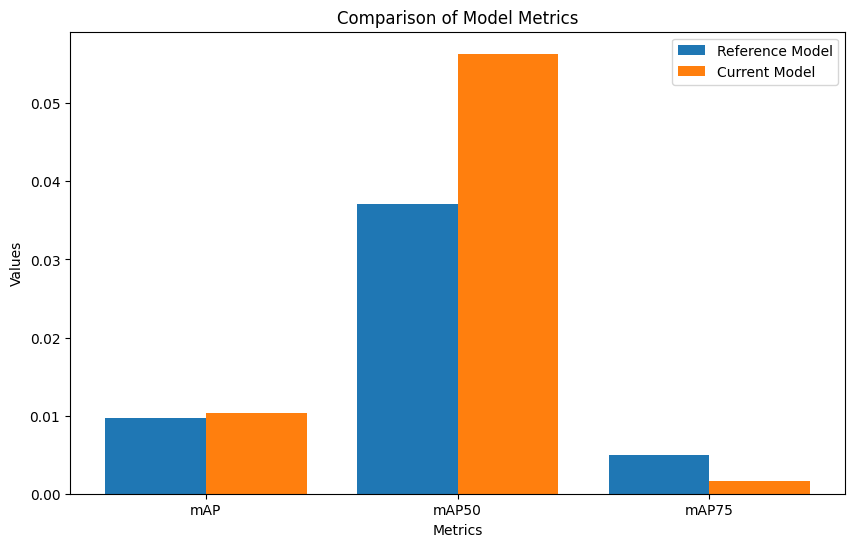

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt

# Assuming ref_metrics and cur_metrics are already defined and contain the necessary data
ref_map = ref_metrics.box.map
ref_map50 = ref_metrics.box.map50
ref_map75 = ref_metrics.box.map75

cur_map = cur_metrics.box.map
cur_map50 = cur_metrics.box.map50
cur_map75 = cur_metrics.box.map75

# Data for plotting
metrics = ['mAP', 'mAP50', 'mAP75']
ref_values = [ref_map, ref_map50, ref_map75]
cur_values = [cur_map, cur_map50, cur_map75]

# Plotting
plt.figure(figsize=(10, 6))
x = range(len(metrics))

plt.bar(x, ref_values, width=0.4, label='Reference Model', align='center')
plt.bar([p + 0.4 for p in x], cur_values, width=0.4, label='Current Model', align='center')

plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Comparison of Model Metrics')
plt.xticks([p + 0.2 for p in x], metrics)
plt.legend()

plt.show()